# Table of Contents
 <p><div class="lev1 toc-item"><a href="#Data-import-and-preprocessing" data-toc-modified-id="Data-import-and-preprocessing-1"><span class="toc-item-num">1&nbsp;&nbsp;</span>Data import and preprocessing</a></div><div class="lev1 toc-item"><a href="#Preparing-Test-Data" data-toc-modified-id="Preparing-Test-Data-2"><span class="toc-item-num">2&nbsp;&nbsp;</span>Preparing Test Data</a></div><div class="lev1 toc-item"><a href="#Kernel-Specification" data-toc-modified-id="Kernel-Specification-3"><span class="toc-item-num">3&nbsp;&nbsp;</span>Kernel Specification</a></div><div class="lev1 toc-item"><a href="#Fitting-GP-on-training-data" data-toc-modified-id="Fitting-GP-on-training-data-4"><span class="toc-item-num">4&nbsp;&nbsp;</span>Fitting GP on training data</a></div><div class="lev2 toc-item"><a href="#Predicting-at-the-test-location" data-toc-modified-id="Predicting-at-the-test-location-4.1"><span class="toc-item-num">4.1&nbsp;&nbsp;</span>Predicting at the test location</a></div><div class="lev2 toc-item"><a href="#Prior-draws" data-toc-modified-id="Prior-draws-4.2"><span class="toc-item-num">4.2&nbsp;&nbsp;</span>Prior draws</a></div><div class="lev2 toc-item"><a href="#Predictive-draws" data-toc-modified-id="Predictive-draws-4.3"><span class="toc-item-num">4.3&nbsp;&nbsp;</span>Predictive draws</a></div><div class="lev1 toc-item"><a href="#Specifying-STAN-model" data-toc-modified-id="Specifying-STAN-model-5"><span class="toc-item-num">5&nbsp;&nbsp;</span>Specifying STAN model</a></div><div class="lev2 toc-item"><a href="#preparing-Stan-data" data-toc-modified-id="preparing-Stan-data-5.1"><span class="toc-item-num">5.1&nbsp;&nbsp;</span>preparing Stan data</a></div><div class="lev1 toc-item"><a href="#Running-STAN" data-toc-modified-id="Running-STAN-6"><span class="toc-item-num">6&nbsp;&nbsp;</span>Running STAN</a></div><div class="lev1 toc-item"><a href="#Plotting" data-toc-modified-id="Plotting-7"><span class="toc-item-num">7&nbsp;&nbsp;</span>Plotting</a></div><div class="lev1 toc-item"><a href="#Observations" data-toc-modified-id="Observations-8"><span class="toc-item-num">8&nbsp;&nbsp;</span>Observations</a></div><div class="lev1 toc-item"><a href="#Diagnosis:-imputations-are-too-noisy/wiggly" data-toc-modified-id="Diagnosis:-imputations-are-too-noisy/wiggly-9"><span class="toc-item-num">9&nbsp;&nbsp;</span>Diagnosis: imputations are too noisy/wiggly</a></div><div class="lev1 toc-item"><a href="#Initialization" data-toc-modified-id="Initialization-10"><span class="toc-item-num">10&nbsp;&nbsp;</span>Initialization</a></div><div class="lev1 toc-item"><a href="#Using-lower-Cholesky" data-toc-modified-id="Using-lower-Cholesky-11"><span class="toc-item-num">11&nbsp;&nbsp;</span>Using <em>lower</em> Cholesky</a></div><div class="lev2 toc-item"><a href="#Plotting" data-toc-modified-id="Plotting-11.1"><span class="toc-item-num">11.1&nbsp;&nbsp;</span>Plotting</a></div>

$$
    \newcommand{\genericdel}[3]{%
      \left#1#3\right#2
    }
    \newcommand{\del}[1]{\genericdel(){#1}}
    \newcommand{\sbr}[1]{\genericdel[]{#1}}
    \newcommand{\cbr}[1]{\genericdel\{\}{#1}}
    \newcommand{\abs}[1]{\genericdel||{#1}}
    \DeclareMathOperator*{\argmin}{arg\,min}
    \DeclareMathOperator*{\argmax}{arg\,max}
    \DeclareMathOperator{\Pr}{\mathbb{p}}
    \DeclareMathOperator{\E}{\mathbb{E}}
    \DeclareMathOperator{\Ind}{\mathbb{I}}
    \DeclareMathOperator{\var}{var}
    \DeclareMathOperator{\cov}{cov}
    \DeclareMathOperator{\invchi}{\mathrm{Inv-\chi}^2}
    \DeclareMathOperator*{\argmin}{arg\,min}
    \DeclareMathOperator*{\argmax}{arg\,max}
    \newcommand{\effect}{\mathrm{eff}}
    \newcommand{\xtilde}{\widetilde{X}}
    \DeclareMathOperator{\normal}{\mathcal{N}}
    \DeclareMathOperator{\unif}{Uniform}
    \DeclareMathOperator{\GP}{\mathcal{GP}}
    \DeclareMathOperator{\l}{\mathscr{l}}
    \newcommand{\Tn}{\mathrm{T}_{n}}
    \newcommand{\Tx}{\mathrm{T}_{x}}
$$

Build the pipeline to get the data into STAN.

In [1]:
using Stan

using TimeSeries
using DataFrames
using GaussianProcesses
using GaussianProcesses: Mean, Kernel, evaluate, metric, IsotropicData, VecF64
using GaussianProcesses: Stationary, KernelData, MatF64, predict
import GaussianProcesses: optimize!, get_optim_target, cov, grad_slice!
import GaussianProcesses: num_params, set_params!, get_params, update_mll!, update_mll_and_dmll!
import GaussianProcesses: get_param_names, cov!, addcov!, multcov!
import Proj4
using Optim
using Distances
using DataFrames: by, head
using Dates: tonext, Hour, Day
;

In [2]:
import PyPlot; plt=PyPlot
using LaTeXStrings
plt.rc("figure", dpi=300.0)
plt.rc("figure", figsize=(12,8))
plt.rc("savefig", dpi=300.0)
plt.rc("text", usetex=true)
plt.rc("font", family="serif")
plt.rc("font", serif="Palatino")
;

# Data import and preprocessing

In [3]:
include("src/preprocessing.jl")
include("src/variogram.jl")
include("src/utils.jl")

measurement_date (generic function with 1 method)

In [4]:
isdList=read_isdList()
isdSubset=isdList[[(usaf in (725450,725460,725480,725485)) for usaf in isdList[:USAF].values],:]
isdSubset

,USAF,WBAN,NAME,CTRY,STATE,ICAO,LAT,LON,ELEV,BEGIN,END,X_PRJ,Y_PRJ
1,725450,14990,THE EASTERN IOWA AIRPORT,US,IA,KCID,41.883,-91.717,264.6,1973,2015,1.64799e6,1.0441e6
2,725460,14933,DES MOINES INTERNATIONAL AIRPORT,US,IA,KDSM,41.534,-93.653,291.7,1973,2015,1.48723e6,1.00379e6
3,725480,94910,WATERLOO MUNICIPAL AIRPORT,US,IA,KALO,42.554,-92.401,264.6,1960,2015,1.59025e6,1.11766e6
4,725485,14940,MASON CITY MUNICIPAL ARPT,US,IA,KMCW,43.154,-93.327,373.4,1973,2015,1.51407e6,1.18374e6


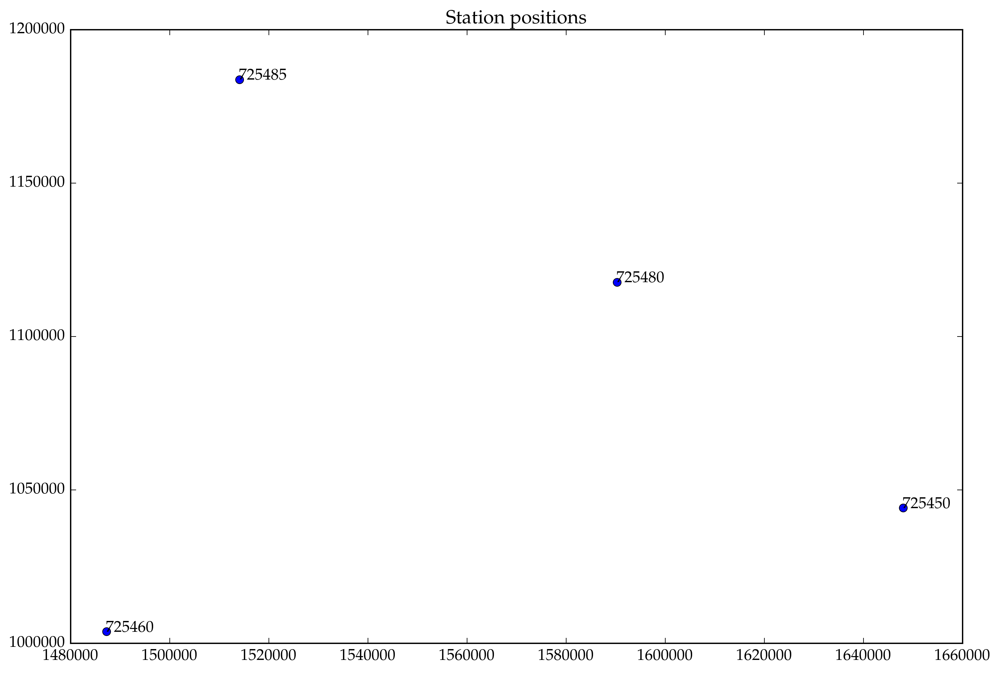

In [5]:
plt.plot(isdSubset[:X_PRJ].values, isdSubset[:Y_PRJ].values, "o")
for r in eachrow(isdSubset)
    plt.text(get(r[:X_PRJ]), get(r[:Y_PRJ]), get(r[:USAF]))
end
plt.title("Station positions")
;

In [6]:
hourly_cat=read_Stations(isdSubset)
itest=3
hourly_train = hourly_cat[hourly_cat[:station].values.!=itest,:]
hourly_test  = hourly_cat[hourly_cat[:station].values.==itest,:]
nrow(hourly_train), nrow(hourly_test)

(35169,12695)

# Preparing Test Data

In [7]:
hr_measure = Hour(17) # number between 0 and 24
hourly_test[:ts_day] = [measurement_date(t, hr_measure) for t in hourly_test[:ts].values]
TnTx = DataFrames.by(hourly_test, :ts_day, df -> DataFrame(
    Tn=minimum(df[:temp].values), 
    Tx=maximum(df[:temp].values)))
test_trimmed=join(hourly_test, TnTx, on=:ts_day)
head(test_trimmed)

,year,month,day,hour,min,seconds,temp,ts,station,ts_hours,ts_day,Tn,Tx
1,2015,1,1,0,0,0,-8.3,2015-01-01T00:00:00,3,0.0,2015-01-01,-11.1,-3.9
2,2015,1,1,0,54,0,-8.9,2015-01-01T00:54:00,3,0.9,2015-01-01,-11.1,-3.9
3,2015,1,1,1,54,0,-8.9,2015-01-01T01:54:00,3,1.9,2015-01-01,-11.1,-3.9
4,2015,1,1,2,54,0,-9.4,2015-01-01T02:54:00,3,2.9,2015-01-01,-11.1,-3.9
5,2015,1,1,3,54,0,-9.4,2015-01-01T03:54:00,3,3.9,2015-01-01,-11.1,-3.9
6,2015,1,1,4,54,0,-10.0,2015-01-01T04:54:00,3,4.9,2015-01-01,-11.1,-3.9


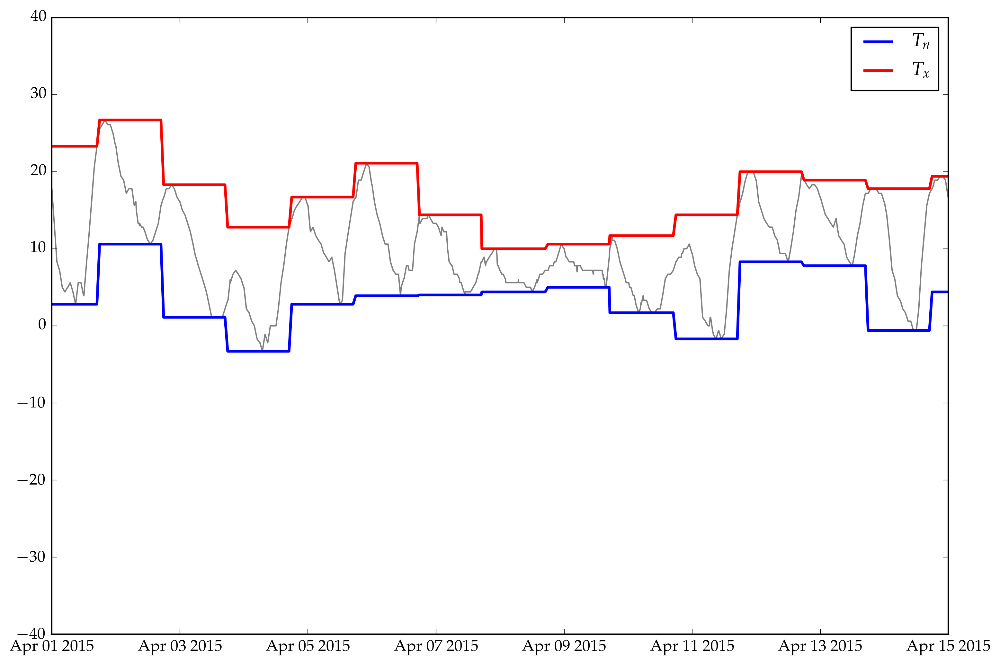

In [8]:
plt.plot(test_trimmed[:ts].values, test_trimmed[:temp].values, color="grey")
plt.plot(test_trimmed[:ts].values, test_trimmed[:Tn].values, color="blue", linewidth=2, label=L"$T_n$")
plt.plot(test_trimmed[:ts].values, test_trimmed[:Tx].values, color="red", linewidth=2, label=L"$T_x$")
plt.xlim(DateTime(2015,4,1),DateTime(2015,4,15)) # random interval
plt.legend()
;

# Kernel Specification

In [50]:
# Temporal
k1 = fix(Periodic(0.0,0.0,log(24.0)), :lp)
k2 = RQIso(0.0,0.0,0.0)
k3 = SEIso(0.0,0.0)
k4 = RQIso(0.0,0.0,0.0)
k5 = RQIso(0.0,0.0,0.0)
k6 = SE(0.0,0.0)
k_time=k1+k2+k3+k4+k5+k6
# hyperparameters fitted in JuliaGP_timeseries_chunks.ipynb
hyp=[-1.4693,-0.0806483,1.0449,1.50786,1.10795,-1.38548,-1.22736,-1.05138,3.09723,1.28737,2.84127,3.64666,0.469691,3.00962,7.70695,-5.39838]
set_params!(k_time, hyp[2:end])

# Spatial
k_spatial = SEIso(log(2*10^5), log(1.0))
hyp=[-1.5875,11.2445,0.132749]
set_params!(k_spatial, hyp[2:3])
logNoise=hyp[1]
;

In [53]:
print("\nTemporal\n================\n")
print("  k₁: Periodic \n-----------------\n")
@printf("     σ: %5.3f\n", √k1.kern.σ2)
@printf("     l: %5.3f\n", √k1.kern.ℓ2)
@printf("     p: %5.0f hours\n", k1.kern.p)
print("\n  k₂: RQIso \n-----------------\n")
@printf("     σ: %5.3f\n", √ k2.σ2)
@printf("     l: %5.3f hours\n", √ k2.ℓ2)
@printf("     α: %5.3f\n", k2.α)
print("\n  k₃: SEIso \n-----------------\n")
@printf("     σ: %5.3f\n", √k3.σ2)
@printf("     l: %5.3f hours\n", √k3.ℓ2)
print("\n  k₄: RQIso \n-----------------\n")
@printf("     σ: %5.3f\n", √k4.σ2)
@printf("     l: %5.3f days\n", √k4.ℓ2 / 24)
@printf("     α: %5.3f\n",  k4.α)
print("\n  k₅: RQIso \n-----------------\n")
@printf("     σ: %5.3f\n", √k5.σ2)
@printf("     l: %5.3f days\n", √k5.ℓ2 / 24)
@printf("     α: %5.3f\n",  k5.α)
print("\n  k₆ SEIso \n-----------------\n")
@printf("     σ: %5.3f\n", √k6.σ2)
@printf("     l: %5.3f days\n", √k6.ℓ2 / 24)
print("\nSpatial\n================\n")
print("\n  k: SEIso \n-----------------\n")
@printf("     σ: %5.3f\n", √k_spatial.σ2)
@printf("     l: %5.3f\n", √k_spatial.ℓ2)
print("\nNoise\n================\n")
@printf("     σy: %5.3f\n", exp(logNoise))


Temporal
  k₁: Periodic 
-----------------
     σ: 2.843
     l: 0.923
     p:    24 hours

  k₂: RQIso 
-----------------
     σ: 3.028
     l: 4.517 hours
     α: 0.250

  k₃: SEIso 
-----------------
     σ: 0.349
     l: 0.293 hours

  k₄: RQIso 
-----------------
     σ: 3.623
     l: 0.922 days
     α: 17.138

  k₅: RQIso 
-----------------
     σ: 1.599
     l: 1.598 days
     α: 20.280

  k₆ SEIso 
-----------------
     σ: 0.005
     l: 92.656 days

Spatial

  k: SEIso 
-----------------
     σ: 1.142
     l: 76458.241

Noise
     σy: 0.204


In [54]:
k_spatiotemporal = Masked(k_time, [1]) * Masked(k_spatial, [2,3])

Type: GaussianProcesses.ProdKernel
  Type: GaussianProcesses.Masked{GaussianProcesses.SumKernel}, Params: [-0.0806483,1.0449,1.50786,1.10795,-1.38548,-1.22736,-1.05138,3.09723,1.28737,2.84127,3.64666,0.469691,3.00962,7.70695,-5.39838]
  Type: GaussianProcesses.Masked{GaussianProcesses.SEIso}, Params: [11.2445,0.132749]


# Fitting GP on training data

In [55]:
function subset(df, from, to)
    after_from = df[:ts].values .>= from
    before_to = df[:ts].values .<= to
    return df[after_from & before_to,:]
end

train_subset = subset(hourly_train,DateTime(2015,5,25,18,0,0), DateTime(2015,6,3,16,0,0))
avgtemp=by(train_subset, :station, df->DataFrame(avgtemp=mean(df[:temp].values)))
train_subset = join(train_subset, avgtemp, on=:station)

train_X_PRJ = isdSubset[:X_PRJ].values[train_subset[:station].values]
train_Y_PRJ = isdSubset[:Y_PRJ].values[train_subset[:station].values]
train_X = [train_subset[:ts_hours].values train_X_PRJ train_Y_PRJ]
train_Y = train_subset[:temp].values .- train_subset[:avgtemp].values

test_subset = subset(test_trimmed,DateTime(2015,5,25,18,0,0), DateTime(2015,6,3,16,0,0))
test_X_PRJ = isdSubset[:X_PRJ].values[test_subset[:station].values]
test_Y_PRJ = isdSubset[:Y_PRJ].values[test_subset[:station].values]
test_X = [test_subset[:ts_hours].values test_X_PRJ test_Y_PRJ]
;

In [56]:
train_GP = GP(train_X', train_Y, MeanZero(), k_spatiotemporal, logNoise);

In [57]:
prior_GP = GP(zeros(3,0), zeros(0), MeanZero(), k_spatiotemporal, logNoise);

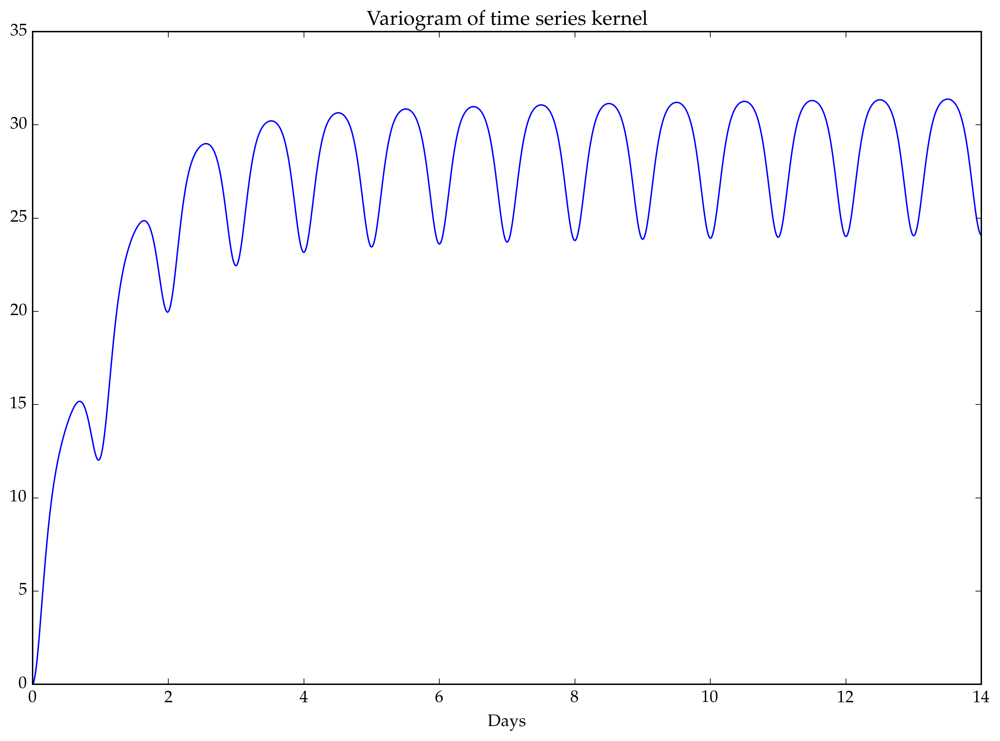

In [60]:
begin
    rr = linspace(0.0, 24*14, 1000)
    ck_r = [cov(k_time, [r],[0.0]) for r in rr]
    plt.plot(rr/24, ck_r[1]-ck_r)
    plt.xlabel("Days")
    plt.title("Variogram of time series kernel")
end
;

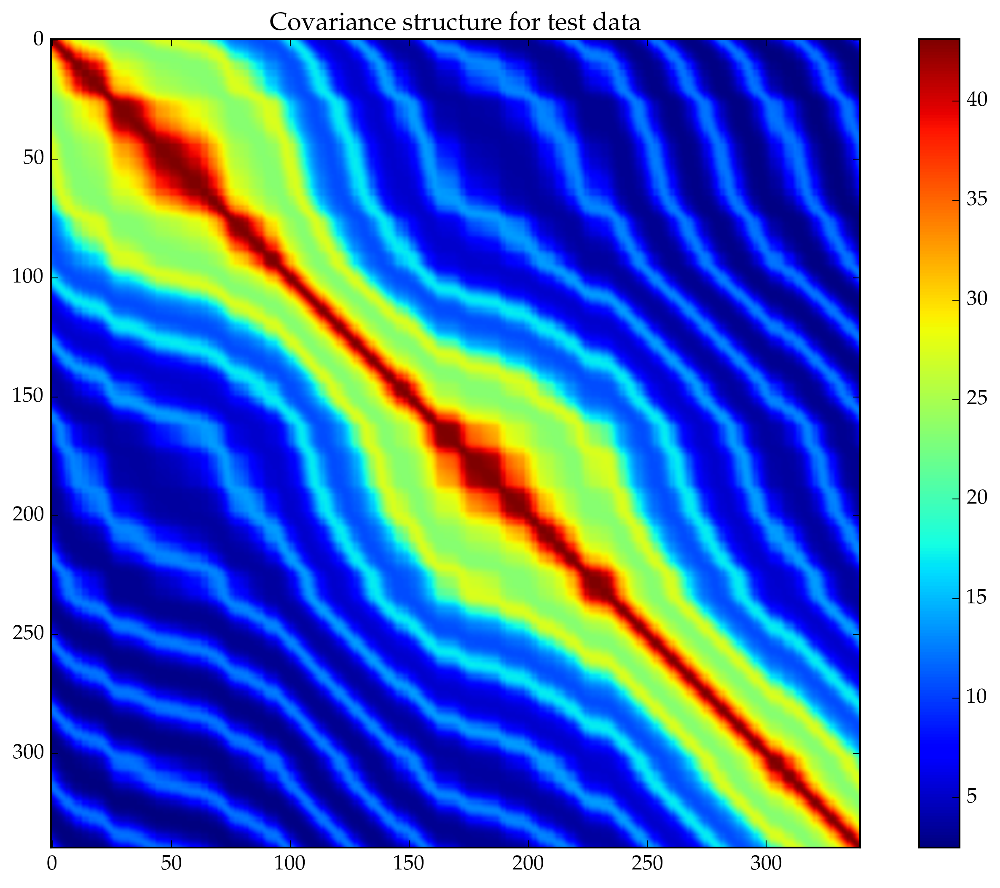

PyObject <matplotlib.colorbar.Colorbar object at 0x32f70c090>

In [61]:
plt.imshow(cov(k_spatiotemporal, test_X'))
plt.title("Covariance structure for test data")
plt.colorbar()

## Predicting at the test location

In [101]:
function add_diag!(Σ::PDMats.PDMat, a::Float64)
    mat = Σ.mat
    for i in 1:size(mat,1)
        mat[i,i] += a
    end
    copy!(Σ.chol.factors, mat)
    cholfact!(Σ.chol.factors, Symbol(Σ.chol.uplo))
    @assert sumabs(mat .- full(Σ.chol)) < 1e-8
    return Σ
end
;

In [103]:
test_prediction=predict(train_GP, test_X'; full_cov=true)
prior_prediction=predict(prior_GP, test_X'; full_cov=true)
add_diag!(test_prediction[2], exp(2*logNoise))
add_diag!(prior_prediction[2], exp(2*logNoise))
;

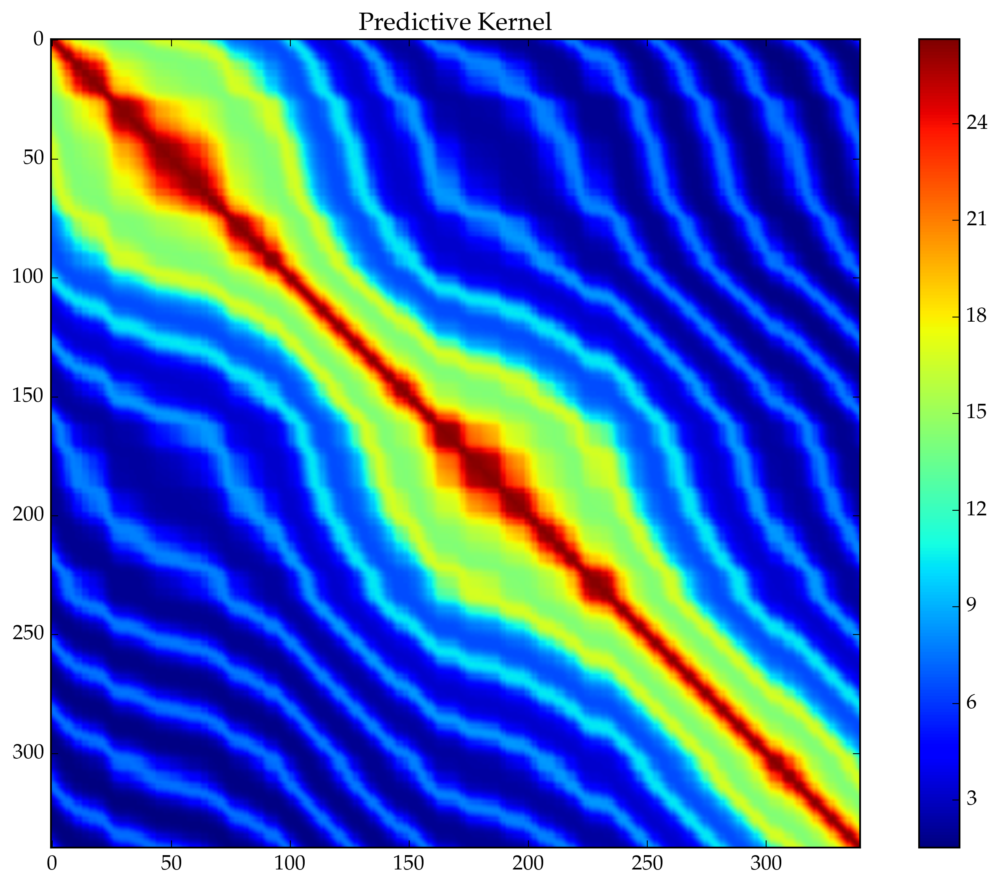

PyObject <matplotlib.colorbar.Colorbar object at 0x325861350>

In [104]:
begin
    plt.imshow(test_prediction[2].mat)
    plt.title("Predictive Kernel")
    plt.colorbar()
end

## Prior draws

Let's look at a few draws from the prior, just to check that the time series kernel is reasonable.

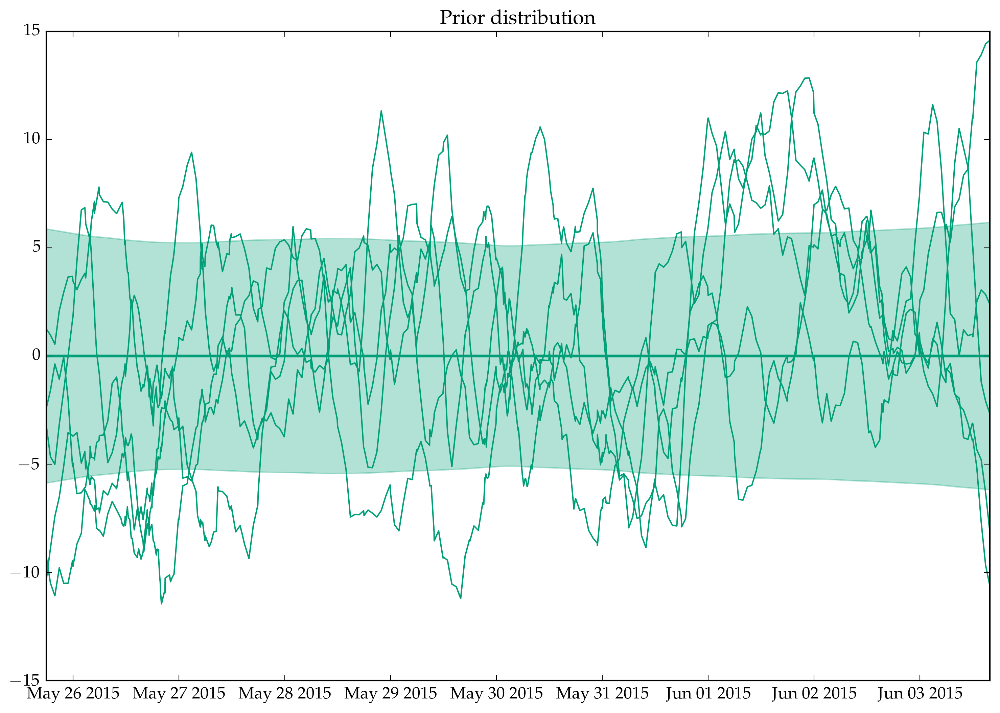

In [107]:
begin
    ts=test_subset[:ts].values
    μ = prior_prediction[1]
    Σ = prior_prediction[2]
    
    nobsv = length(μ)
    centering = eye(nobsv) .- (1.0/nobsv) .* ones(nobsv, nobsv)
    Σ_centered = centering * Σ.mat * centering

    distr = MultivariateNormal(μ, Σ)
    plt.plot(ts, μ, color="#009F77", linewidth=2, label="prior mean")
    for _ in 1:5
        temp_sim = rand(distr)
        plt.plot(ts, temp_sim.-mean(temp_sim), color="#009F77", linewidth=1)
    end
    plt.fill_between(ts, μ-√diag(Σ_centered),μ+√diag(Σ_centered), color="#009F77", alpha=0.3)

    plt.title("Prior distribution")
end
;

## Predictive draws

Let's show some draws from the posterior fitted using the hourly data at nearby stations, but *not* the $T_n$ and $T_x$ records.

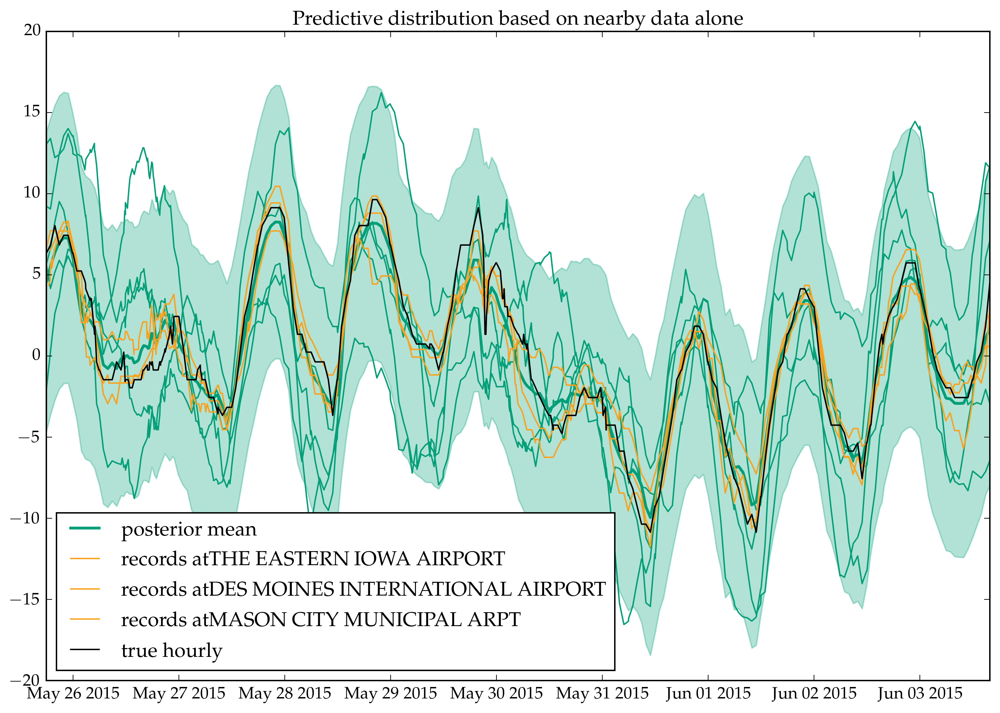

In [106]:
begin
    ts=test_subset[:ts].values
    μ = test_prediction[1]
    Σ = test_prediction[2]
    nobsv = length(μ)
    
    centering = eye(nobsv) .- (1.0/nobsv) .* ones(nobsv, nobsv)
    Σ_centered = centering * Σ.mat * centering
    distr = MultivariateNormal(μ, Σ)
    plt.plot(ts, μ, color="#009F77", linewidth=2, label="posterior mean")
    for _ in 1:5
        temp_sim = rand(distr)
        plt.plot(ts, temp_sim.-mean(temp_sim), color="#009F77", linewidth=1)
    end
    plt.fill_between(ts, μ-2*√diag(Σ_centered),μ+2*√diag(Σ_centered), color="#009F77", alpha=0.3)
    for station in unique(train_subset[:station].values)
        sdata = train_subset[train_subset[:station].values.==station,:]
        ts=sdata[:ts].values
        plt.plot(ts, sdata[:temp].values.-mean(sdata[:temp].values), color="#F8A21F", 
            label="records at"get(isdSubset[station,:NAME]))
    end
    ts = test_subset[:ts].values
    temp_true = test_subset[:temp].values
    plt.plot(ts, temp_true.-mean(temp_true), 
        color="black", "-", label="true hourly")
    plt.legend(loc="best")
    plt.title("Predictive distribution based on nearby data alone")
end
;

It's interesting to note that the posterior mean is quite close to the truth, despite the very wide credible envelope. To me this suggests that the information available from nearby stations is underweighted. We should be making more confident predictions.

In [100]:
begin
    ts=test_subset[:ts].values
    μ = test_prediction[1]
    Σ = test_prediction[2]
    nobsv = length(μ)
    
    centering = eye(nobsv) .- (1.0/nobsv) .* ones(nobsv, nobsv)
    Σ_centered = centering * Σ.mat * centering
    distr = MultivariateNormal(μ, Σ)
#     println("sum(Σ_centered)=", sum(Σ_centered*Σ_centered))
    for _ in 1:5
        temp_sim = rand(distr)
        println("var(predicted mean - simulated prediction)=", var(μ .- temp_sim))
    end
    temp_true = test_subset[:temp].values
    println("E(var(predict-simulate))=", mean(var(μ .- rand(distr)) for _ in 1:2000))
    println("var(true-predicted mean)=", var(μ .- temp_true))
end
;

var(predicted mean - simulated prediction)=19.23167975486394
var(predicted mean - simulated prediction)=10.297520379340321
var(predicted mean - simulated prediction)=19.85957589199337
var(predicted mean - simulated prediction)=35.55745809808757
var(predicted mean - simulated prediction)=15.239819466792788
E(var(predict-simulate))=17.996067123862503
var(true-predicted mean)=1.4387475607078573


# Specifying STAN model

In [68]:
imputation_model = """
functions {
    real softmax(vector x, real k){
        real max10x;
        max10x = max(k*x);
        return (max10x+log(sum(exp(k*x - max10x))))/k;
    }
    real softmin(vector x, real k){
        return -softmax(-x, k);
    }
}
data {
    // Tn Tx data
    int<lower=1> N_TxTn; //
    vector[N_TxTn] Tx;
    vector[N_TxTn] Tn;
    
    // imputation points (for which we have )
    int<lower=1> Nimpt;
    int<lower=1,upper=N_TxTn> day_impute[Nimpt];
    // number of hours recorded within each day
    int<lower=1> impt_times_p_day[N_TxTn];
    
    // prior 
    vector[Nimpt] predicted_mean;
    matrix[Nimpt,Nimpt] predicted_cov;
    matrix[Nimpt,Nimpt] predicted_cov_chol;
    
    // control soft max hardness
    real<lower=0> k_softmax;
}
parameters {
    vector[Nimpt] temp_impt;
    real mu;
}
transformed parameters {
    real Tsoftmax[N_TxTn];
    real Tsoftmin[N_TxTn];  
    {
        int istart;
        istart = 1;
        for (i in 1:N_TxTn){
            int ntimes;
            ntimes = impt_times_p_day[i];
            Tsoftmin[i] = softmin(segment(temp_impt,istart,ntimes)+mu, k_softmax);
            Tsoftmax[i] = softmax(segment(temp_impt,istart,ntimes)+mu, k_softmax);
            istart = istart + ntimes;
        }
    }
}
model {
    // temp_impt ~ multi_normal(predicted_mean, predicted_cov);
    mu ~ normal(0, 100.0);
    temp_impt ~ multi_normal_cholesky(predicted_mean, predicted_cov_chol);
    Tn ~ normal(Tsoftmin, 0.1);
    Tx ~ normal(Tsoftmax, 0.1);
}
"""
;

## preparing Stan data

In [69]:
test_TxTn = by(test_subset, :ts_day, df -> DataFrame(
    Tn=first(df[:Tn]), 
    Tx=first(df[:Tx]), 
    times_p_day=nrow(df),
))

,ts_day,Tn,Tx,times_p_day
1,2015-05-26,15.6,25.6,46
2,2015-05-27,13.9,22.8,54
3,2015-05-28,13.9,26.7,27
4,2015-05-29,16.7,27.2,31
5,2015-05-30,12.8,26.7,59
6,2015-05-31,6.7,16.1,36
7,2015-06-01,6.7,19.4,28
8,2015-06-02,10.0,21.7,32
9,2015-06-03,15.0,23.9,27


In [70]:
ts_day = test_subset[:ts_day].values
day_impute = convert(Vector{Int}, ts_day .- minimum(ts_day))+1
imputation_data = Dict(
    "N_TxTn" => nrow(test_TxTn),
    "Tn" => test_TxTn[:Tn].values,
    "Tx" => test_TxTn[:Tx].values,
    "Nimpt" => nrow(test_subset),
    "day_impute" => day_impute,
    "impt_times_p_day" => test_TxTn[:times_p_day].values,
    "predicted_mean" => test_prediction[1],
    "predicted_cov" => test_prediction[2].mat,
    "predicted_cov_chol" => full(test_prediction[2].chol[:U]),
    "k_softmax" => 10.0,
    
)

Dict{String,Any} with 10 entries:
  "Tx"                 => [25.6,22.8,26.7,27.2,26.7,16.1,19.4,21.7,23.9]
  "predicted_cov_chol" => [5.16414 5.01948 … 1.03861 1.22247; 0.0 1.12382 … -0.…
  "impt_times_p_day"   => [46,54,27,31,59,36,28,32,27]
  "Nimpt"              => 340
  "Tn"                 => [15.6,13.9,13.9,16.7,12.8,6.7,6.7,10.0,15.0]
  "N_TxTn"             => 9
  "day_impute"         => [1,1,1,1,1,1,1,1,1,1  …  9,9,9,9,9,9,9,9,9,9]
  "predicted_cov"      => [26.6684 25.9213 … 5.36354 6.31299; 25.9213 26.4581 ……
  "predicted_mean"     => [4.59327,5.49982,6.35748,6.98804,7.26961,7.26073,6.14…
  "k_softmax"          => 10.0

# Running STAN

In [71]:
nchains=4

4

In [72]:
stanmodel = Stanmodel(name="imputation", model=imputation_model, nchains=nchains);
@time sim1 = stan(stanmodel, [imputation_data], CmdStanDir=Stan.CMDSTAN_HOME);


make: `/Users/imolk/Documents/Harvard/Natesh/temperature_model/tmp/imputation' is up to date.

Length of data array is not equal to nchains,
all chains will use the first data dictionary.

Inference for Stan model: imputation_model
4 chains: each with iter=(1000,1000,1000,1000); warmup=(0,0,0,0); thin=(1,1,1,1); 4000 iterations saved.

Warmup took (179, 188, 260, 189) seconds, 14 minutes total
Sampling took (136, 136, 117, 135) seconds, 8.7 minutes total

                     Mean     MCSE   StdDev        5%       50%       95%  N_Eff  N_Eff/s    R_hat
lp__             -1.9e+02  3.6e-01  1.3e+01  -2.1e+02  -1.9e+02  -1.7e+02   1245  2.4e+00  1.0e+00
accept_stat__     7.9e-01  2.2e-02  2.4e-01   2.0e-01   8.9e-01   1.0e+00    118  2.3e-01  1.0e+00
stepsize__        6.3e-02  2.3e-03  3.3e-03   5.7e-02   6.5e-02   6.5e-02    2.0  3.8e-03  3.2e+13
treedepth__       6.0e+00  4.1e-03  2.6e-01   6.0e+00   6.0e+00   6.0e+00   4000  7.6e+00  1.0e+00
n_leapfrog__      6.2e+01  6.9e-02  4.3e+00 

In [73]:
describe(sim1)

Iterations = 1:1000
Thinning interval = 1
Chains = 1,2,3,4
Samples per chain = 1000

Empirical Posterior Estimates:
                   Mean           SD         Naive SE        MCSE         ESS    
         lp__ -188.223299250 12.583711977 0.19896595633 0.38964456499 1000.000000
accept_stat__    0.794070311  0.242900834 0.00384059941 0.01155129825  442.177274
   stepsize__    0.062820000  0.003311692 0.00005236245 0.00053022886   39.009752
  treedepth__    5.951500000  0.256250202 0.00405167145 0.00864210029  879.204352
 n_leapfrog__   62.298000000  4.343260524 0.06867297863 0.14133620582  944.332430
  divergent__    0.028750000  0.167123966 0.00264246193 0.00517869774 1000.000000
     energy__  358.884146500 18.297386674 0.28930708560 0.57166727433 1000.000000
  temp_impt.1    3.141905142  3.125296472 0.04941527607 0.09177965707 1000.000000
  temp_impt.2    5.500532043  1.165920863 0.01843482749 0.02112852806 1000.000000
  temp_impt.3    6.345515267  0.969895577 0.01533539558 0.016766

In [74]:
# convenience function to extract the imputed temperatures
# from the STAN model object
temp_varnames=[@sprintf("temp_impt.%d", i) for i in 1:imputation_data["Nimpt"]]

function get_temperatures(sim::Mamba.Chains)
    nsamples = size(sim,1)
    mu_samples=getindex(sim, :, "mu", :).value
    temp_samples=getindex(sim, :, temp_varnames, :).value
    temp_impute=broadcast(+, mu_samples, temp_samples)
    return temp_impute
end

temp_impute = get_temperatures(sim1);

# Plotting

In [75]:
stacked_impute=vcat((temp_impute[:,:,i] for i in 1:size(temp_impute,3))...)
sorted_impute = sort(stacked_impute,1);
nsamples=size(sorted_impute,1)
# extract and 2.5th and 97.5th percentiles
# of the imputations
imputed_025 = sorted_impute[div(nsamples,40), :]
imputed_975 = sorted_impute[nsamples-div(nsamples,40), :]
;

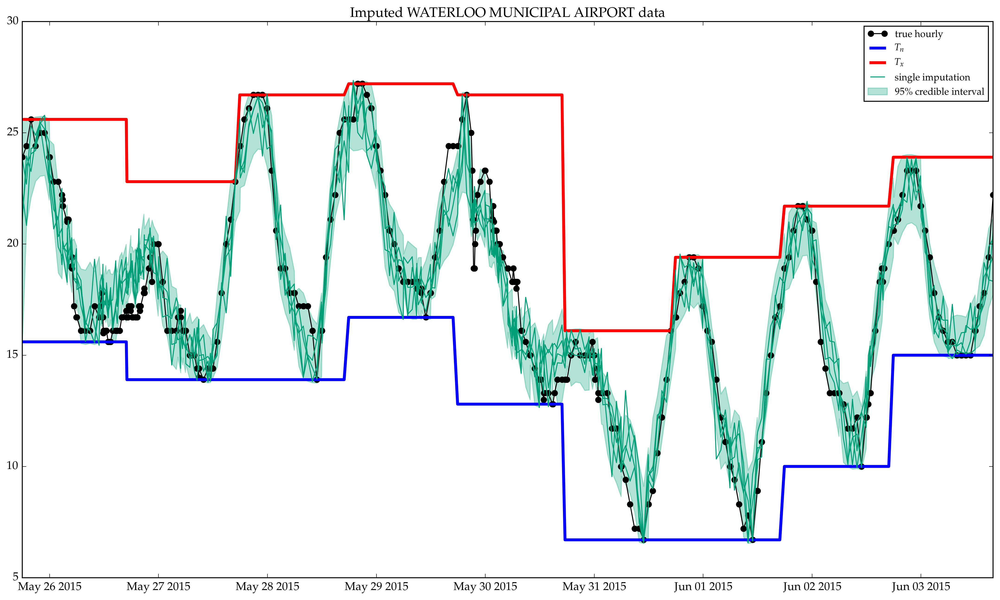

In [76]:
begin
    ts = test_subset[:ts].values
    plt.plot(ts, test_subset[:temp].values, 
        color="black", "o-", label="true hourly")
    plt.plot(ts, test_subset[:Tn].values, 
        color="blue", linewidth=3, label=L"$T_n$")
    plt.plot(ts, test_subset[:Tx].values, 
        color="red", linewidth=3, label=L"$T_x$")
    plt.fill_between(ts, imputed_025, imputed_975, 
        color="#009F77", alpha=0.3, label=L"$95\%$ credible interval")
    plt.plot(ts, temp_impute[250,:,1],
        color="#009F77", label="single imputation")
    for i in 2:size(temp_impute,3)
        plt.plot(ts, temp_impute[250,:,i], color="#009F77")
    end
    plt.legend(loc="best", fontsize="small")
    plt.gcf()[:set_size_inches](18.0, 10.0)
    plt.title(@sprintf("Imputed %s data", get(isdSubset[itest,:NAME])))
end
;

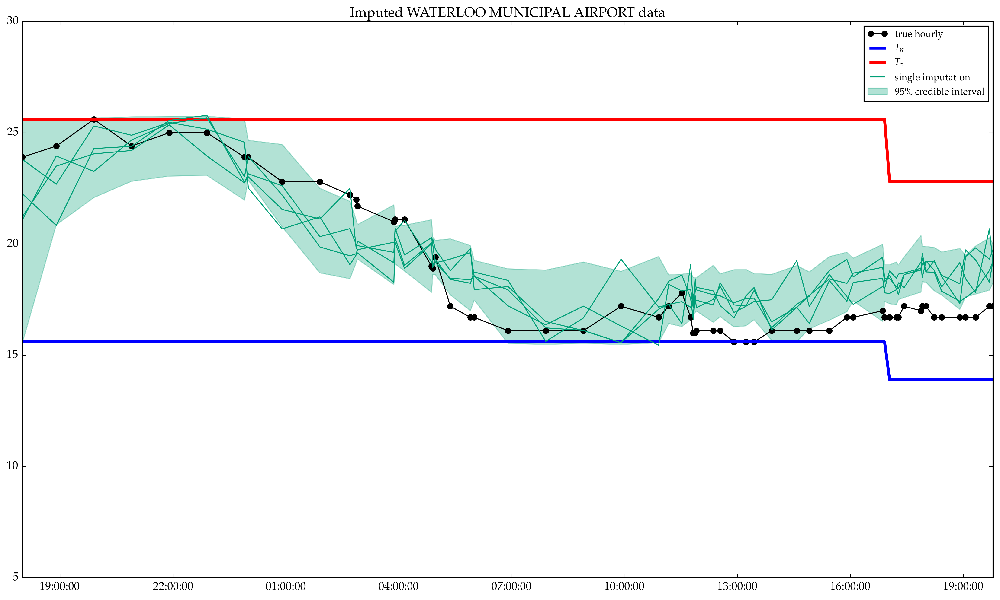

In [77]:
begin
    ts = test_subset[:ts].values
    plt.plot(ts, test_subset[:temp].values, 
        color="black", "o-", label="true hourly")
    plt.plot(ts, test_subset[:Tn].values, 
        color="blue", linewidth=3, label=L"$T_n$")
    plt.plot(ts, test_subset[:Tx].values, 
        color="red", linewidth=3, label=L"$T_x$")
    plt.fill_between(ts, imputed_025, imputed_975, 
        color="#009F77", alpha=0.3, label=L"$95\%$ credible interval")
    plt.plot(ts, temp_impute[250,:,1],
        color="#009F77", label="single imputation")
    for i in 2:size(temp_impute,3)
        plt.plot(ts, temp_impute[250,:,i], color="#009F77")
    end
    plt.legend(loc="best", fontsize="small")
    plt.gcf()[:set_size_inches](18.0, 10.0)
    plt.title(@sprintf("Imputed %s data", get(isdSubset[itest,:NAME])))
    plt.xlim(ts[1], ts[60])
end
;

# Observations

This is quite similar to the previous plot I showed that did the entire analysis in `STAN`, but now we have a more complete kernel, fitted by optimizing the marginal log-likelihood, which to me means that we have a more believable model of the temporal and spatial covariance structures. The other change is that we've now separated the imputation procedure into two separate steps, which use two separate sources of information about the temperatures:

1. the hourly temperatures at nearby stations
2. the $T_n$ and $T_x$ records at the test station

The advantage is that incorporating the nearby hourly temperatures can be done analytically once we specify a Gaussian Process model. So that step is computationally very quick. We then only use Stan (Hamiltonian Monte Carlo) to add the second source of information. The STAN model is therefore hugely simplified, and the fitting time is greatly reduced.

We're getting good convergence diagnostics from Stan, and the imputed temperatures:
1. stay within the constraints imposed by $T_n$ and $T_x$
2. are very close to the true temperatures at Waterloo Municipal Airport
3. on May 27th and 28th the model accurately finds that the high for both days is set in the same afternoon, and that the peak of the previous diurnal cycle does not get recorded

Sources of worry are:
* the imputed temperatures are too noisy, the true temperatures are smoother, like in the draws from the predictive distribution we saw coming out of the $\GP$
* the 95% credible envelope also isn't very smooth
* the true temperatures sometimes drift out of the 95% envelope, though not necessarily more often than they should

# Diagnosis: imputations are too noisy/wiggly

They look too noisy. Are they too noisy?

First compute the average square temperature changes in the imputed hourly temperatures.
For a single chain, this is:

$$\frac{1}{T}\sum_{t=2}^T \del{C_t - C_{t-1}}$$

where $C_t$ is the imputed temperature ($C$ for Celsius) at time $t$.

In [78]:
msdiff(x) = mean(diff(x).^2)

msdiff(temp_impute[1,:,1]) # single chain

1.6080603737195955

We then average over all the chains

In [79]:
mean(msdiff(temp_impute[i,:,k]) for i in 1:500 for k in 1:4)

1.739645216636487

And then we compare this to the true temperature records:

In [80]:
msdiff(test_subset[:temp].values)

0.9557817109144543

Which confirms that our imputed temperaturs are too noisy. 
At which stage is this excess noise introduced.
We can start by looking at the same quantity for prior draws:

In [81]:
begin
    μ = prior_prediction[1]
    Σ = prior_prediction[2]
    distr = MultivariateNormal(μ, Σ)
    mean(msdiff(rand(distr)) for _ in 1:1000)
end

0.9871531379593518

That's pretty close to the observed value, so our prior is not to blame. How about our predictive distribution fitted to nearby data?

In [82]:
begin
    μ = test_prediction[1]
    Σ = test_prediction[2]
    distr = MultivariateNormal(μ, Σ)
    mean(msdiff(rand(distr)) for _ in 1:1000)
end

1.3295260220932699

That went up, so maybe some blame lies in the predictive distribution, but we're still not as variable as in the imputations.

Is the variability being pulled up by higher variability at other stations? Let's look at the measured noises at other stations.

In [83]:
by(train_subset, :station, df->msdiff(df[:temp].values))

,station,x1
1,1,1.03842
2,2,0.725949
3,4,1.14058


No, that's not the issue. Maybe the sampling implementation for MultivariateNormal is noisy. Let's check by using the same code as in the GaussianProcesses package:

In [84]:
begin
    μ = test_prediction[1]
    Σ = test_prediction[2]
    nobsv = length(μ)
    n_sample = 1000
    A = Array(Float64, nobsv, n_sample)
    broadcast!(+, A, μ, PDMats.unwhiten!(Σ,randn(nobsv, n_sample)))
    mean(msdiff(A[:,k]) for k in 1:n_sample)
end

1.3207109098596888

That's not the issue either. While we're at it, note that the posterior average is smoother than real data (which seems normal!):

In [85]:
msdiff(test_prediction[1])

0.5149508543320899

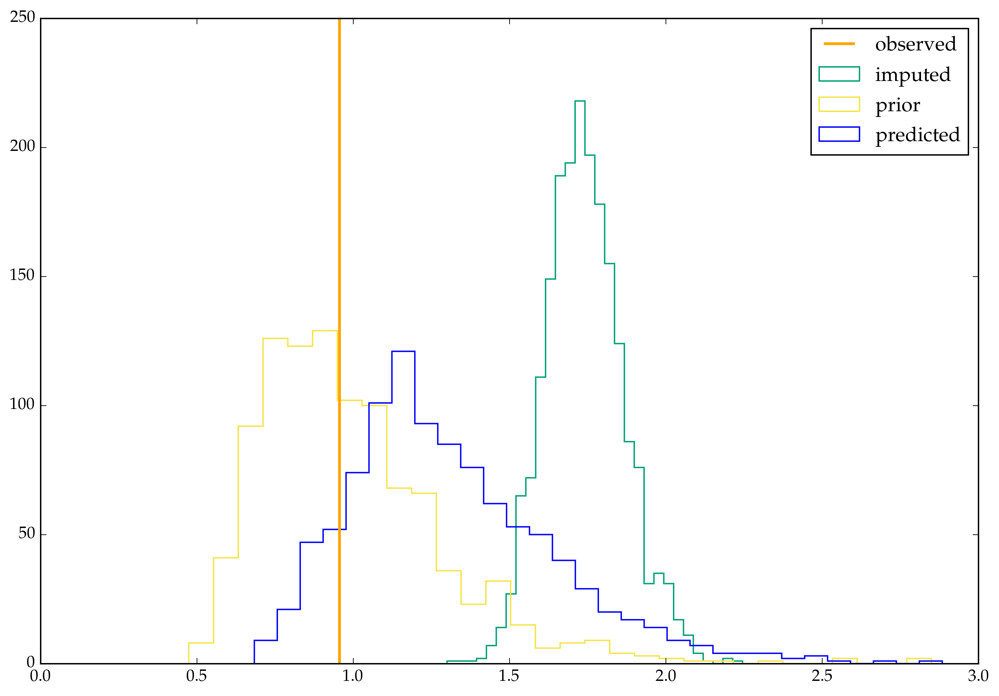

In [86]:
begin
    imputed_msdiffs = collect(msdiff(temp_impute[i,:,k]) for i in 1:500 for k in 1:4)
    observed_msdiff = msdiff(test_subset[:temp].values)
    plt.plt[:hist](imputed_msdiffs, histtype="step", color="#009F77", bins=30, label="imputed")
    
    μ = prior_prediction[1]
    Σ = prior_prediction[2]
    distr = MultivariateNormal(μ, Σ)
    prior_msdiffs = collect(msdiff(rand(distr)) for _ in 1:1000)
    plt.plt[:hist](prior_msdiffs, histtype="step", color="#F4E44A", bins=30, label="prior")
    
    μ = test_prediction[1]
    Σ = test_prediction[2]
    distr = MultivariateNormal(μ, Σ)
    predicted_msdiffs = collect(msdiff(rand(distr)) for _ in 1:1000)
    plt.plt[:hist](predicted_msdiffs, histtype="step", color="blue", bins=30, label="predicted")
    
    plt.axvline(observed_msdiff, color="orange", linewidth=2, label="observed")
    plt.legend(loc="best")
end
;

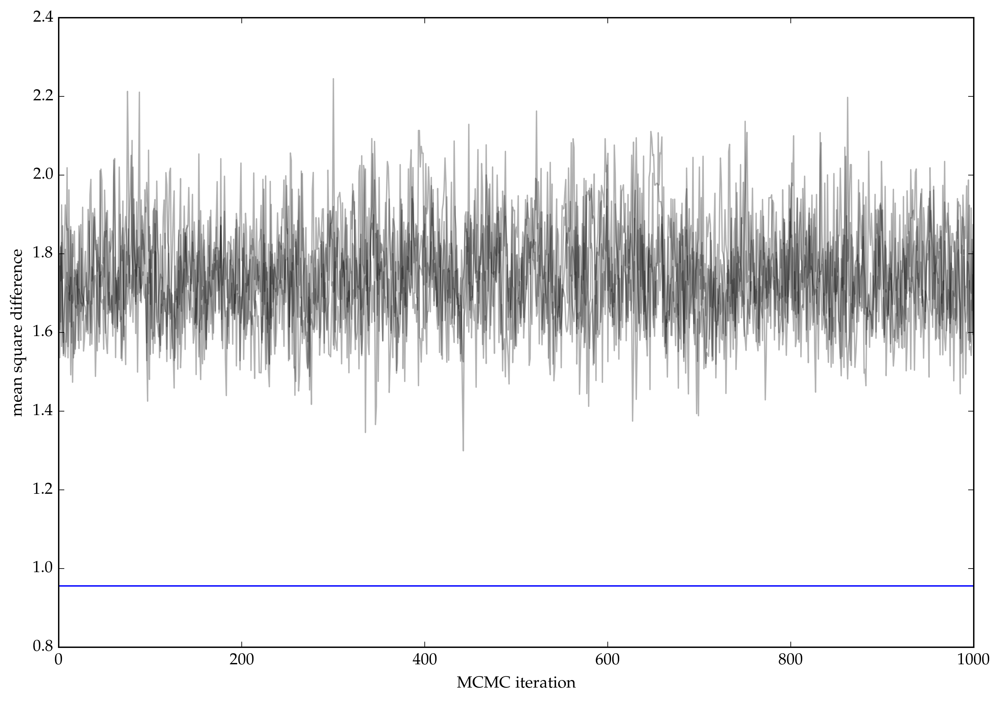

In [87]:
begin
    for k in 1:4
        imputed_msdiffs = collect(msdiff(temp_impute[i,:,k]) for i in 1:1000)
        plt.plot(1:1000, imputed_msdiffs, color="black", alpha=0.3)
    end
    observed_msdiff = msdiff(test_subset[:temp].values)
    plt.axhline(observed_msdiff)
    plt.xlabel("MCMC iteration")
    plt.ylabel("mean square difference")
end;

Looking at these histograms, it really looks like the Stan stage, through which we incorporate the $\Tn$ and $\Tx$ data, is introducing the bulk of the noise into the imputed temperatures.

# Initialization

Stan's initialization doesn't sample from the prior. Rather it generates a random number for each parameter, with no reference to the model. I want to check if I get smoother imputations by initializing from the prior.

In [88]:
init = [Dict(
    "mu" => mean((mean(test_subset[:Tn].values),mean(test_subset[:Tx].values))),
    "temp_imput" => rand(train_GP, test_X'),
    "Tsoftmin" => test_subset[:Tn].values,
    "Tsoftmax" => test_subset[:Tx].values,
) for i in 1:nchains]

4-element Array{Dict{String,Any},1}:
 Dict{String,Any}(Pair{String,Any}("Tsoftmin",[15.6,15.6,15.6,15.6,15.6,15.6,15.6,15.6,15.6,15.6  …  15.0,15.0,15.0,15.0,15.0,15.0,15.0,15.0,15.0,15.0]),Pair{String,Any}("Tsoftmax",[25.6,25.6,25.6,25.6,25.6,25.6,25.6,25.6,25.6,25.6  …  23.9,23.9,23.9,23.9,23.9,23.9,23.9,23.9,23.9,23.9]),Pair{String,Any}("temp_imput",[-1.00993,0.176283,0.617262,0.798155,1.19636,1.56709,2.2046,2.43542,1.5575,0.657668  …  6.40964,6.07148,5.5191,5.60312,5.13033,4.937,4.80832,5.34192,6.43779,7.87187]),Pair{String,Any}("mu",18.0601))                  
 Dict{String,Any}(Pair{String,Any}("Tsoftmin",[15.6,15.6,15.6,15.6,15.6,15.6,15.6,15.6,15.6,15.6  …  15.0,15.0,15.0,15.0,15.0,15.0,15.0,15.0,15.0,15.0]),Pair{String,Any}("Tsoftmax",[25.6,25.6,25.6,25.6,25.6,25.6,25.6,25.6,25.6,25.6  …  23.9,23.9,23.9,23.9,23.9,23.9,23.9,23.9,23.9,23.9]),Pair{String,Any}("temp_imput",[11.7127,13.1644,14.8396,14.9004,12.4436,10.229,8.15199,7.87339,5.25384,2.52563  …  -6.40773,-5.32273,-3.05112

In [89]:
stanmodel2 = Stanmodel(name="imputation", model=imputation_model, nchains=nchains, init=Stan.Init(init=init));
@time sim2 = stan(stanmodel2, [imputation_data], CmdStanDir=Stan.CMDSTAN_HOME);

LoadError: UndefVarError: stanmode2 not defined

# Using *lower* Cholesky

In [90]:
imputation_model_2 = """
functions {
    real softmax(vector x, real k){
        real max10x;
        max10x = max(k*x);
        return (max10x+log(sum(exp(k*x - max10x))))/k;
    }
    real softmin(vector x, real k){
        return -softmax(-x, k);
    }
}
data {
    // Tn Tx data
    int<lower=1> N_TxTn; //
    vector[N_TxTn] Tx;
    vector[N_TxTn] Tn;
    
    // imputation points (for which we have )
    int<lower=1> Nimpt;
    int<lower=1,upper=N_TxTn> day_impute[Nimpt];
    // number of hours recorded within each day
    int<lower=1> impt_times_p_day[N_TxTn];
    
    // prior 
    vector[Nimpt] predicted_mean;
    matrix[Nimpt,Nimpt] predicted_cov;
    matrix[Nimpt,Nimpt] predicted_cov_chol;
    
    // control soft max hardness
    real<lower=0> k_softmax;
}
parameters {
    vector[Nimpt] temp_impt;
    real mu;
}
transformed parameters {
    real Tsoftmax[N_TxTn];
    real Tsoftmin[N_TxTn];  
    {
        int istart;
        istart = 1;
        for (i in 1:N_TxTn){
            int ntimes;
            ntimes = impt_times_p_day[i];
            Tsoftmin[i] = softmin(segment(temp_impt,istart,ntimes)+mu, k_softmax);
            Tsoftmax[i] = softmax(segment(temp_impt,istart,ntimes)+mu, k_softmax);
            istart = istart + ntimes;
        }
    }
}
model {
    temp_impt ~ multi_normal(predicted_mean, predicted_cov);
    mu ~ normal(0, 100.0);
    // temp_impt ~ multi_normal_cholesky(predicted_mean, predicted_cov_chol);
    Tn ~ normal(Tsoftmin, 0.1);
    Tx ~ normal(Tsoftmax, 0.1);
}
"""
;

In [91]:
imputation_data_2 = Dict(
    "N_TxTn" => nrow(test_TxTn),
    "Tn" => test_TxTn[:Tn].values,
    "Tx" => test_TxTn[:Tx].values,
    "Nimpt" => nrow(test_subset),
    "day_impute" => day_impute,
    "impt_times_p_day" => test_TxTn[:times_p_day].values,
    "predicted_mean" => test_prediction[1],
    "predicted_cov" => test_prediction[2].mat,
    "predicted_cov_chol" => full(test_prediction[2].chol[:L]),
    "k_softmax" => 10.0,
    
)

Dict{String,Any} with 10 entries:
  "Tx"                 => [25.6,22.8,26.7,27.2,26.7,16.1,19.4,21.7,23.9]
  "predicted_cov_chol" => [5.16414 0.0 … 0.0 0.0; 5.01948 1.12382 … 0.0 0.0; … …
  "impt_times_p_day"   => [46,54,27,31,59,36,28,32,27]
  "Nimpt"              => 340
  "Tn"                 => [15.6,13.9,13.9,16.7,12.8,6.7,6.7,10.0,15.0]
  "N_TxTn"             => 9
  "day_impute"         => [1,1,1,1,1,1,1,1,1,1  …  9,9,9,9,9,9,9,9,9,9]
  "predicted_cov"      => [26.6684 25.9213 … 5.36354 6.31299; 25.9213 26.4581 ……
  "predicted_mean"     => [4.59327,5.49982,6.35748,6.98804,7.26961,7.26073,6.14…
  "k_softmax"          => 10.0

In [92]:
@time sim2 = stan(stanmodel, [imputation_data_2], CmdStanDir=Stan.CMDSTAN_HOME);


make: `/Users/imolk/Documents/Harvard/Natesh/temperature_model/tmp/imputation' is up to date.

Length of data array is not equal to nchains,
all chains will use the first data dictionary.

Inference for Stan model: imputation_model
4 chains: each with iter=(1000,1000,1000,1000); warmup=(0,0,0,0); thin=(1,1,1,1); 4000 iterations saved.

Warmup took (2315, 2493, 2369, 2392) seconds, 2.7 hours total
Sampling took (2076, 1958, 2012, 2048) seconds, 2.2 hours total

                     Mean     MCSE   StdDev        5%       50%       95%  N_Eff  N_Eff/s    R_hat
lp__             -1.7e+02  3.6e-01  1.3e+01  -1.9e+02  -1.7e+02  -1.5e+02   1300  1.6e-01  1.0e+00
accept_stat__     9.1e-01  1.7e-03  1.1e-01   6.9e-01   9.5e-01   1.0e+00   4000  4.9e-01  1.0e+00
stepsize__        9.2e-03  9.2e-04  1.3e-03   8.4e-03   8.6e-03   1.1e-02    2.0  2.5e-04  9.1e+13
treedepth__       9.2e+00  1.1e-02  6.8e-01   8.0e+00   9.0e+00   1.0e+01   3734  4.6e-01  1.0e+00
n_leapfrog__      7.8e+02  4.6e+00  2.7

## Plotting

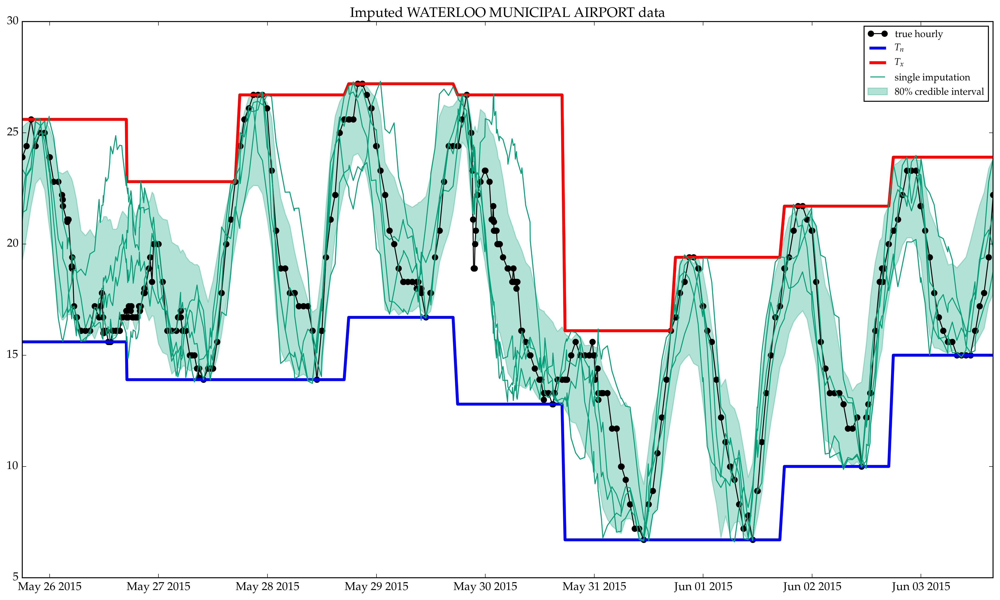

In [93]:
begin;
    temp_impute = get_temperatures(sim2)
    stacked_impute=vcat((temp_impute[:,:,i] for i in 1:size(temp_impute,3))...)
    sorted_impute = sort(stacked_impute,1);
    nsamples=size(sorted_impute,1)
    # extract and 2.5th and 97.5th percentiles
    # of the imputations
    imputed_10 = sorted_impute[div(nsamples,10), :]
    imputed_90 = sorted_impute[nsamples-div(nsamples,10), :]
    ts = test_subset[:ts].values
    plt.plot(ts, test_subset[:temp].values, 
        color="black", "o-", label="true hourly")
    plt.plot(ts, test_subset[:Tn].values, 
        color="blue", linewidth=3, label=L"$T_n$")
    plt.plot(ts, test_subset[:Tx].values, 
        color="red", linewidth=3, label=L"$T_x$")
    plt.fill_between(ts, imputed_10, imputed_90, 
        color="#009F77", alpha=0.3, label=L"$80\%$ credible interval")
    plt.plot(ts, temp_impute[250,:,1],
        color="#009F77", label="single imputation")
    for i in 2:size(temp_impute,3)
        plt.plot(ts, temp_impute[250,:,i], color="#009F77")
    end
    plt.legend(loc="best", fontsize="small")
    plt.gcf()[:set_size_inches](18.0, 10.0)
    plt.title(@sprintf("Imputed %s data", get(isdSubset[itest,:NAME])))
end;

Right! Using the *lower* Cholesky decomposition is definitely correct. By using the upper Cholesky above, Stan was essentially missing all the correlations, and treating the covariance as a diagonal matrix. This explains why the predictions were noisy, and closely clustered around the mean.

We're now getting smoother imputations that look more like the real data. However, the time to run the MCMC has gone up five-fold, from 10 minutes to almost an hour. The effective sample size has also gone down a lot. Furthermore, the credible interval is now much wider, which is in agreement with the wide envelope we saw above for predictions using nearby data only. As a consequence, on May 27th, some imputations now hit $T_x$ early in the measurement window (incorrect), and some imputations hit at at the end (correct). This is reassuring in the sense that the model is able to pick out these two possible scenarios, but wrong in the sense that there should be enough information available from nearby stations to rule out the first (incorrect) scenario.

Let's draw the histogram of smoothness again to check that the noisiness problem is solved:

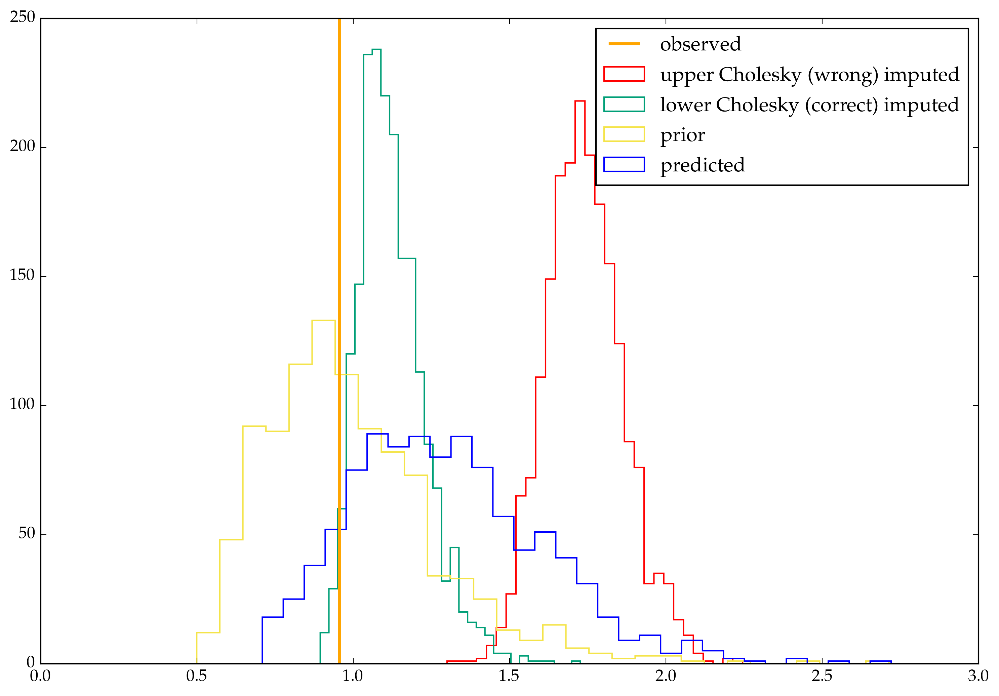

In [94]:
begin
    temp_impute_1 = get_temperatures(sim1)
    imputed_msdiffs = collect(msdiff(temp_impute_1[i,:,k]) for i in 1:500 for k in 1:4)
    observed_msdiff = msdiff(test_subset[:temp].values)
    plt.plt[:hist](imputed_msdiffs, histtype="step", color="red", bins=30, label="upper Cholesky (wrong) imputed")
    
    temp_impute_2 = get_temperatures(sim2)
    imputed_msdiffs = collect(msdiff(temp_impute_2[i,:,k]) for i in 1:500 for k in 1:4)
    observed_msdiff = msdiff(test_subset[:temp].values)
    plt.plt[:hist](imputed_msdiffs, histtype="step", color="#009F77", bins=30, label="lower Cholesky (correct) imputed")
    
    μ = prior_prediction[1]
    Σ = prior_prediction[2]
    distr = MultivariateNormal(μ, Σ)
    prior_msdiffs = collect(msdiff(rand(distr)) for _ in 1:1000)
    plt.plt[:hist](prior_msdiffs, histtype="step", color="#F4E44A", bins=30, label="prior")
    
    μ = test_prediction[1]
    Σ = test_prediction[2]
    distr = MultivariateNormal(μ, Σ)
    predicted_msdiffs = collect(msdiff(rand(distr)) for _ in 1:1000)
    plt.plt[:hist](predicted_msdiffs, histtype="step", color="blue", bins=30, label="predicted")
    
    plt.axvline(observed_msdiff, color="orange", linewidth=2, label="observed")
    plt.legend(loc="best")
end
;

Next steps:

* Improve the spatial model so we leverage the nearby hourly data better
* Explore ways to reparametrize the Stan model to accelerate imputations and improve mixing